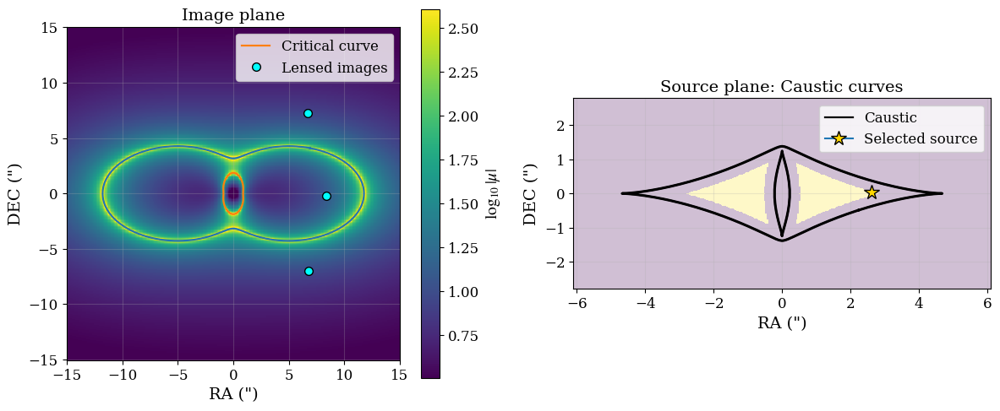

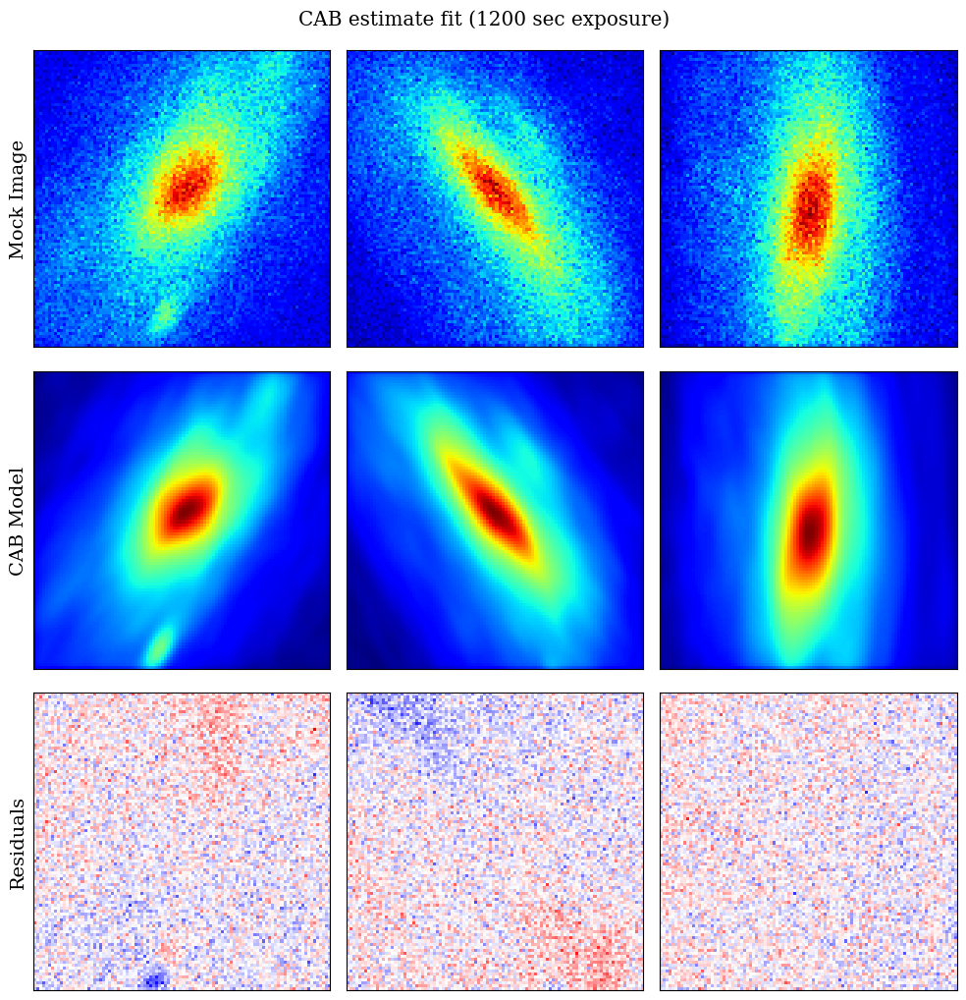

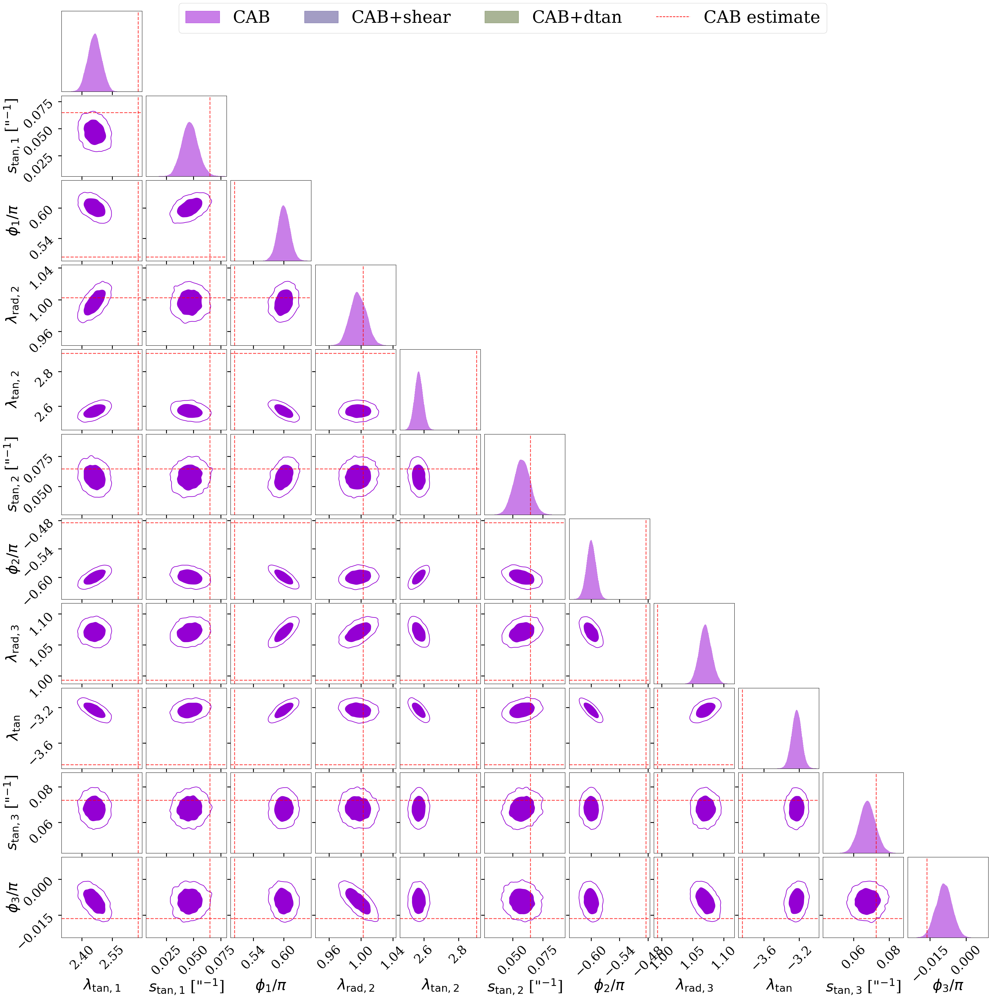

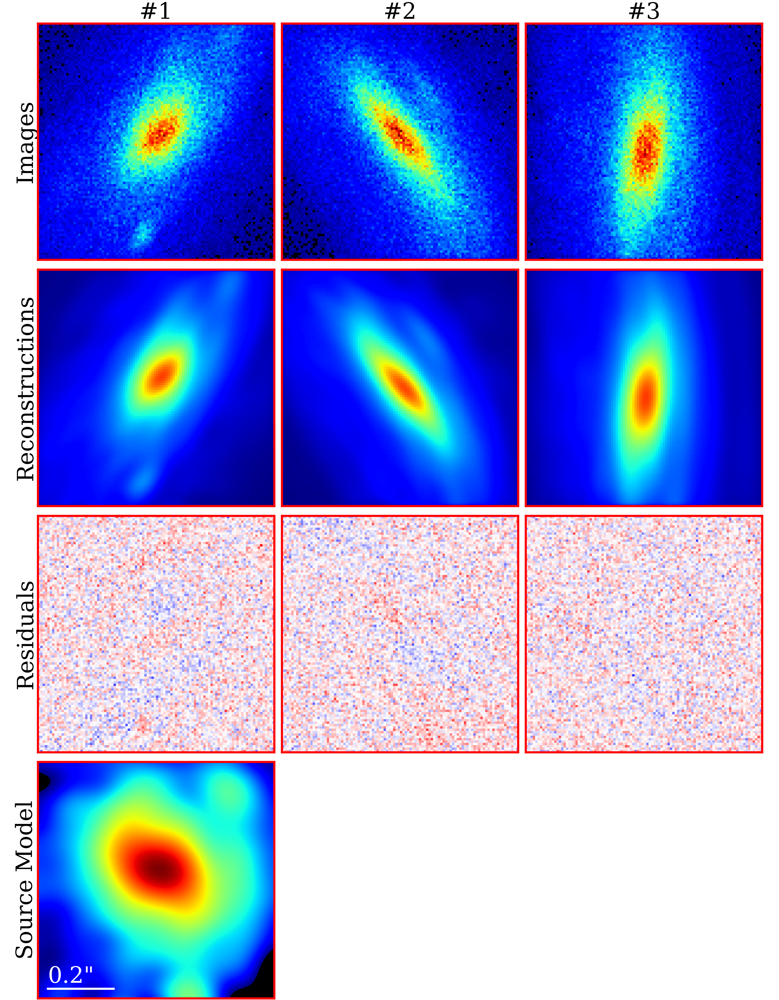

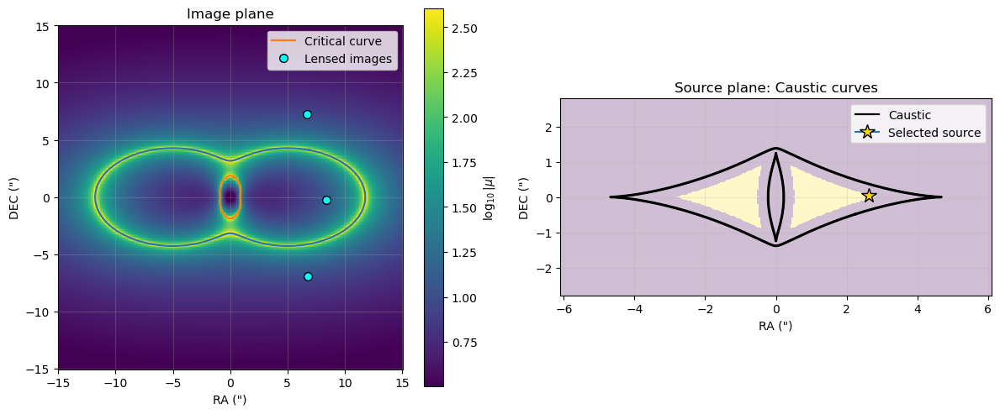

...

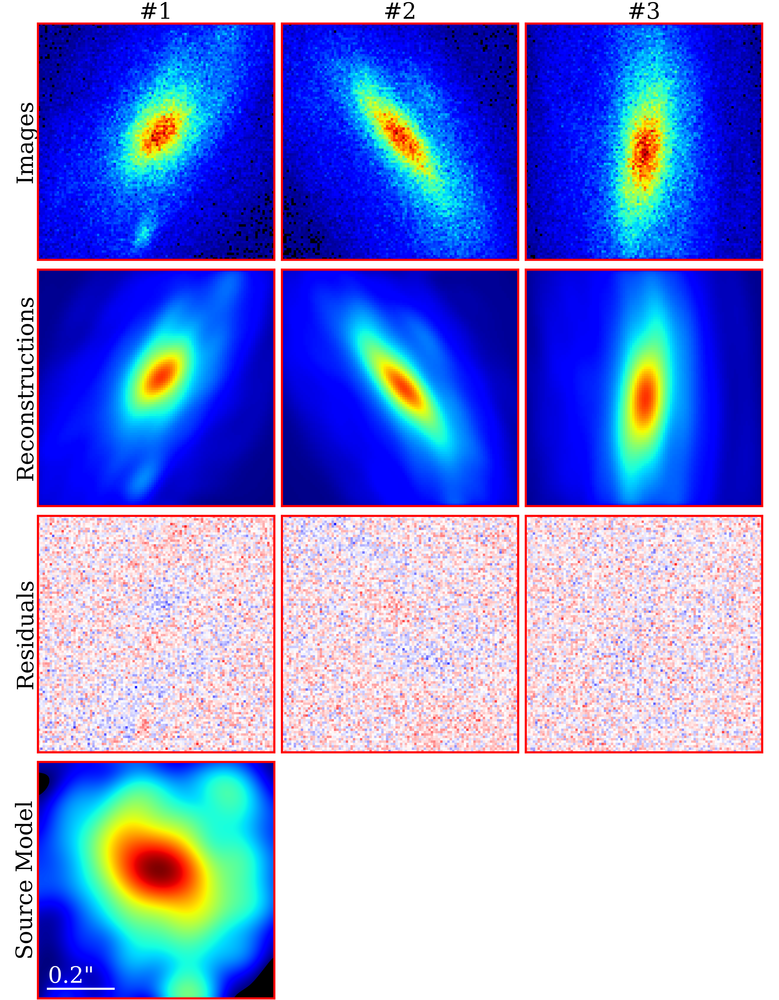

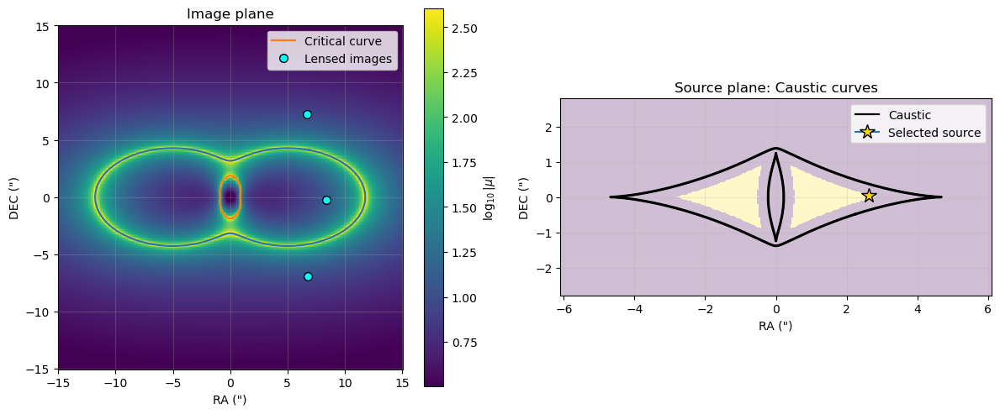

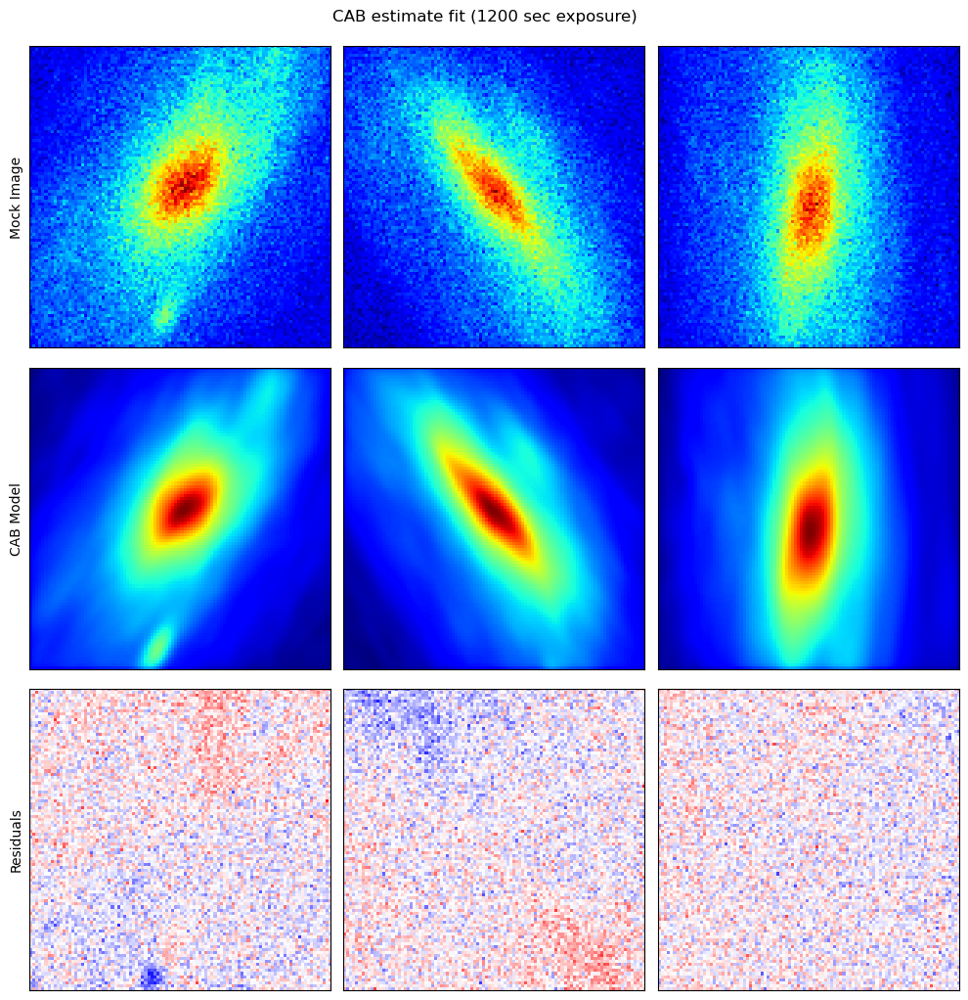

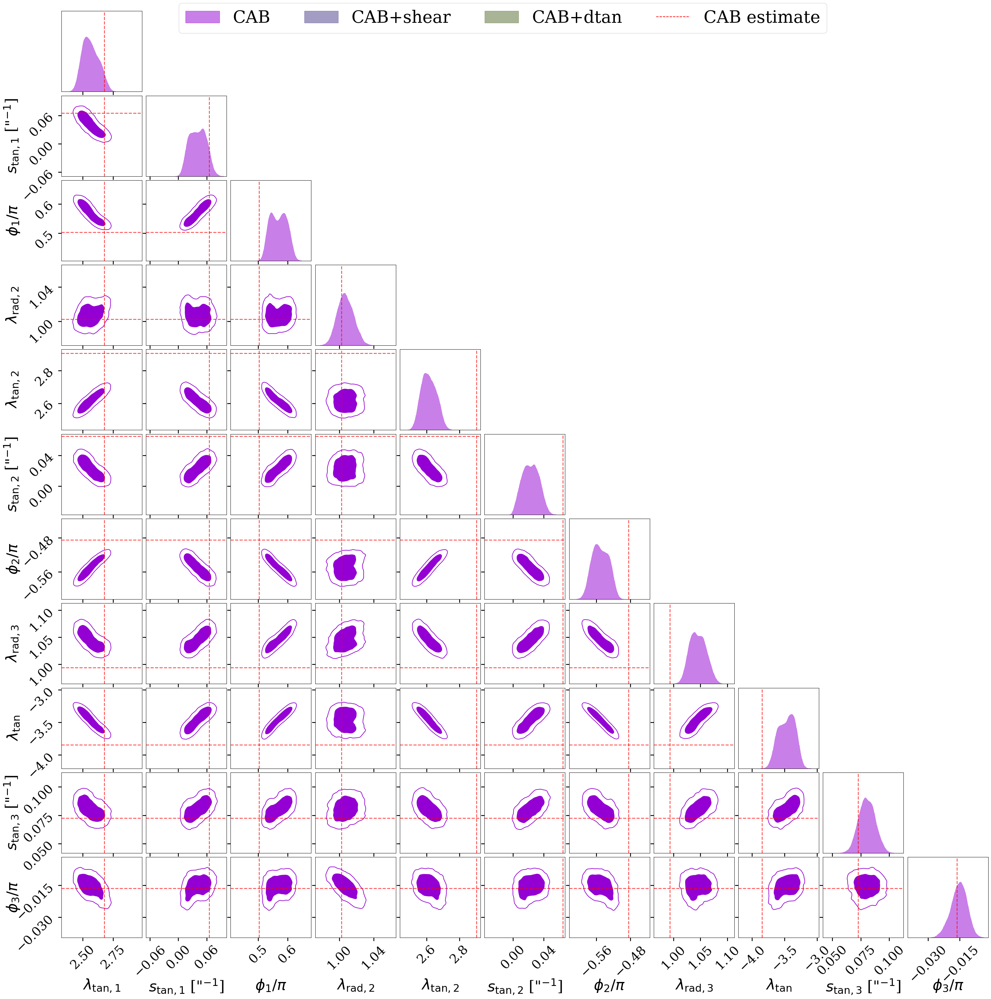

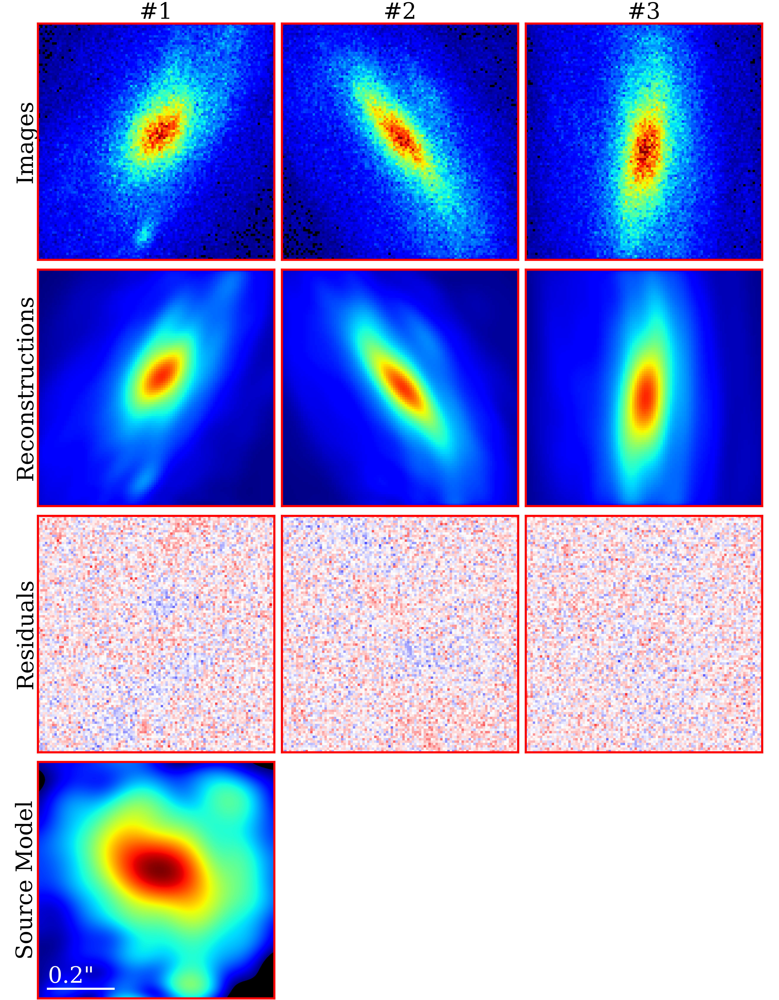

In [31]:
import os
import numpy as np
import matplotlib.pyplot as plt
import warnings
import matplotlib
from lenstronomy.Util import util
from lenstronomy.LightModel.light_model import LightModel
from lenstronomy.LensModel.lens_model import LensModel
from lenstronomy.LensModel.Solver.lens_equation_solver import LensEquationSolver
from lenstronomy.Data.imaging_data import ImageData
from lenstronomy.ImSim.image_model import ImageModel
from lenstronomy.Plots import lens_plot, plot_util
from lenstronomy.Util import simulation_util as sim_util
from lenstronomy.Util import param_util, image_util
from lenstronomy.Cosmo.lens_cosmo import LensCosmo
import lenstronomy.Util.param_util as param_util
from multiprocessing import Pool
import dynesty
from dynesty import utils as dyfunc
from dynesty import plotting as dyplot
# Import PySwarms
import pyswarms as ps
import copy
import pickle
from astropy.cosmology import Planck15 as cosmo
import argparse
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
import matplotlib as mpl
import matplotlib.lines as lines
import matplotlib.cm as cm
from util_funcs import *

mpl.rcParams.update({
    "font.size": 12,            # base font size
    "font.family": "serif",     # use serif fonts
    "font.serif": ["Times New Roman", "Times", "DejaVu Serif"],  
    "mathtext.fontset": "stix", # matches Times for math
    "axes.labelsize": 14,       # axis labels
    "axes.titlesize": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 12,})

generate_mocks = False
fit_mocks_sampling = False
plot_figs = True
save_figs = False
save_mocks = False
dynesty_analysis = True

cab_model = "CURVED_ARC_SIS_MST"
mock_set_idx = 0
num_mocks_sets = 20 #20
nmax = 20
exp_time = 1200
substructure_model = "CDM"
log10_m_uldm = -20.0

prior_width = 1.5

num_pix = 100 #200
filt = 150
cnk = 1

deltaPix = 0.031230659851709842*cnk  #  pixel size in arcsec (area per pixel = deltaPix**2)
M200, c_conc = 1e15, 4.0
z_lens, z_source = 0.4, 1.0
offset, width = 0.3, 0.6

##################################################################################
#                     Toy Cluster Lens Model: Elliptical NFW                     #
##################################################################################

cosmo = FlatLambdaCDM(H0=70, Om0=0.3)
lens_cosmo = LensCosmo(z_lens=z_lens, z_source=z_source, cosmo=cosmo)

Rs_angle, alpha_Rs = lens_cosmo.nfw_physical2angle(M=M200, c=c_conc)

lens_model_list_macro = ['NFW_ELLIPSE_CSE']
lens_model_macro = LensModel(lens_model_list_macro)
lens_ext_macro = LensModelExtensions(lens_model_macro)

kwargs_lens_macro = [{
    'Rs': Rs_angle,
    'alpha_Rs': alpha_Rs,
    'e1': 0.27,   # Average cluster ellipticity from Shin et al. 2018
    'e2': 0.0,
    'center_x': 0.0,
    'center_y': 0.0}]

all_subs_residuals = []

subs_models = ['CDM', 'ULDM']
uldm_masses = [-20., -20.5, -21., -21.5, -22.0]

for substructure_model in subs_models:
        
    if substructure_model == "ULDM":
        masses_to_loop = uldm_masses
    else:
        masses_to_loop = [None]  # dummy value so loop still runs once

    for log10_m_uldm in masses_to_loop:
        
        all_residuals = []
        
        for mock_set_idx in range(num_mocks_sets):
            
            if mock_set_idx > 0: plot_figs = False
                
            else: plot_figs = True

            base_seed = 124 + mock_set_idx

            out_dir = f'M=1e{int(np.log10(M200))}_c={int(c_conc)}_zl={z_lens}_zs={z_source}_o={offset}_w={width}_npix={num_pix}_exp={int(exp_time/60)}'

            if substructure_model == "ULDM":

                out_dir += f'_uldm_m={log10_m_uldm}'

            file_path = f'/n/netscratch/dvorkin_lab/Lab/nephremidze/1-Statistical_substructure/0-joint_source_lens_fit/dm_substructure/{out_dir}/'

            pkl_path = os.path.join(f'{file_path}/subs={substructure_model}_{cab_model}_shapelet_fit_set=#{mock_set_idx+1}_nmax={nmax}_prior_width={prior_width}.pkl')
            if not (os.path.exists(pkl_path)):
                continue
                        
            mock_imgs = np.load(os.path.join(file_path + f'subs={substructure_model}_set_#{mock_set_idx+1}_seed={base_seed}_mock_imgs.npy'))
            pixel_errors = np.load(os.path.join(file_path + f'subs={substructure_model}_set_#{mock_set_idx+1}_seed={base_seed}_mock_errs.npy'))

            array150sci  = mock_imgs[0]
            array150err  = pixel_errors[0]

            array150sci2 = mock_imgs[1]
            array150err2 = pixel_errors[1]

            array150sci3 = mock_imgs[2]
            array150err3 = pixel_errors[2]

            ##################################################################################
            #                                   COSMOS Source                                #
            ##################################################################################

            random.seed(base_seed); np.random.seed(base_seed)

            # Generate a random COSMOS source, smoothing out HST noise with a Gaussian
            src_list, kwargs_source = get_source_kwargs(base_seed, z_source, smoothing_sigma=0.1)
            src_model = LightModel(light_model_list=src_list)

            # Generate a random source position between two caustic lines
            (x_src, y_src, d,
             caustic_outer, caustic_inner, bbox, 
             ra_crit, dec_crit, ra_caus, dec_caus) = generate_source_pos(lens_ext_macro, kwargs_lens_macro,
                                                                         offset, width, base_seed)

            # Ray trace source position to find locations of 3 lensed images 
            solver = LensEquationSolver(lens_model_macro)
            x_imgs, y_imgs = solver.image_position_from_source(x_src, y_src, kwargs_lens_macro,
                                                               search_window=30.)

            if plot_figs == True:
                visualize_source_selection(lens_model_macro, kwargs_lens_macro, caustic_inner, caustic_outer,
                                           ra_caus, dec_caus, ra_crit, dec_crit, bbox,
                                           offset, width, x_src, y_src, x_imgs, y_imgs, save_figs, out_dir, mock_set_idx)

            ##################################################################################
            #                           Estimate CAB params from NFW                         #
            ##################################################################################

            cab_lensed_imgs = []
            all_cab_estimates = []

            for i in range(len(x_imgs)):

                cab_lensed_img, all_cab_estimates = render_cab_est_imgs(i, lens_ext_macro,
                                                                        x_imgs, y_imgs, 
                                                                        kwargs_source, kwargs_lens_macro,
                                                                        z_lens, z_source, cosmo, 
                                                                        all_cab_estimates, num_pix, exp_time)
                cab_lensed_imgs.append(cab_lensed_img)


            if plot_figs == True:

                visualize_cab_est_fit(substructure_model, mock_imgs, cab_lensed_imgs, pixel_errors, save_figs, exp_time, out_dir, mock_set_idx)

            # Make CAB parameter truth array to compare to

            rad_stretch_1 = all_cab_estimates[0][0]

            for i in range(len(all_cab_estimates)):

                for j in range(2):

                    all_cab_estimates[i][j] /= rad_stretch_1

            # all_cab_est_flat = np.array(all_cab_estimates).flatten()

            cab_truths = np.array(all_cab_estimates).flatten()[1:]

            ##################################################################################
            #                              Make dynesty cornerplot                           #
            ##################################################################################

            std = 5.
            y_height = 2.

            file_path = f'/n/netscratch/dvorkin_lab/Lab/nephremidze/1-Statistical_substructure/0-joint_source_lens_fit/dm_substructure/{out_dir}/'

            datasets = [(f"{file_path}/subs={substructure_model}_"
                         f"{cab_model}_shapelet_fit_set=#{mock_set_idx+1}_"
                         f"nmax={nmax}_prior_width={prior_width}")]
            
            if plot_figs:

                overplot_models(datasets, cab_truths, cab_model, num_pix, std=5., y_height=2., nmax=20)

            ##################################################################################
            #                         Plot best-fit model reconstructions                    #
            ##################################################################################

            dresults = load_obj(f'{file_path}/subs={substructure_model}_{cab_model}_shapelet_fit_set=#{mock_set_idx+1}_nmax={nmax}_prior_width={prior_width}')

            #errorfixin
            for i in range(len(array150err)):
                for j in range(len(array150err)):
                    if array150err[i,j] == 0:
                        array150err[i,j] = np.inf
                    if array150err2[i,j] == 0:
                        array150err2[i,j] = np.inf
                    if array150err3[i,j] == 0:
                        array150err3[i,j] = np.inf

            arytst = rechunk(array150sci,cnk)
            arytst2 = rechunk(array150sci2,cnk)
            arytst3 = rechunk(array150sci3,cnk)

            arytsterr = rechunkerr(array150err,cnk)
            arytsterr2 = rechunkerr(array150err2,cnk)
            arytsterr3 = rechunkerr(array150err3,cnk)

            numPix2 = int(num_pix/cnk)

            kernel_cut = np.load(f'/n/netscratch/dvorkin_lab/Lab/nephremidze/1-Statistical_substructure/sim_api_learn/jwst_psf_{filt}_sim.npy')

            for i in range(91):
                for j in range(91):
                    if kernel_cut[i,j] < 0:
                        kernel_cut[i,j] = 0.

            psf_type = 'PIXEL'
            kwargs_psf = {'psf_type': psf_type, 'pixel_size': deltaPix/cnk,'kernel_point_source': kernel_cut}
            psf_class = PSF(**kwargs_psf)

            kwargs_numerics = {'supersampling_factor': 1}

            sigma_bkg = background_rms_per_sec(exp_time)
            kwargs_data2 = sim_util.data_configure_simple(numPix2, deltaPix, exp_time, sigma_bkg)
            data_class2 = ImageData(**kwargs_data2)

            #######################################################
            # small masks
            likemask = np.ones((num_pix, num_pix), dtype=bool)
            likemask2 = np.ones((num_pix, num_pix), dtype=bool)
            likemask3 = np.ones((num_pix, num_pix), dtype=bool)

            # we swap places of first and second mocks, so that radial stretch of first mock = 1
            imagearr = np.array([arytst,arytst2,arytst3])
            noises = np.array([arytsterr,arytsterr2,arytsterr3])
            likemasks = np.array([likemask,likemask2,likemask3])
            likearr = likemasks

            flatarr = flatten2d(imagearr,likemasks)
            flaterror = flatten2d(noises,likemasks)

            indices = [0,1,2]

            for i in range(len(flaterror)):
                if flaterror[i] == 0:
                    flaterror[i] = np.inf

            unflatimg = unflatten(flatarr,likemasks)

            maxl, bestf, cv = bestfit(dresults)
            imagevis, sourcevis,lnl  = visualize(bestf, nmax, imagearr, likearr, indices,
                                                 kwargs_numerics, data_class2, psf_class,
                                                 flatarr, flaterror, exp_time, sigma_bkg)

            res1, res2, res3 = visualize_bestf_imgs(sourcevis, imagevis, 
                                                     array150sci, array150sci2, array150sci3, 
                                                     arytsterr, arytsterr2, arytsterr3, 
                                                     likemask, likemask2, likemask3,
                                                     plot_figs=plot_figs)

            all_residuals.extend([res1, res2, res3])
            
            mpl.rcdefaults()

        all_subs_residuals.append(all_residuals)

    

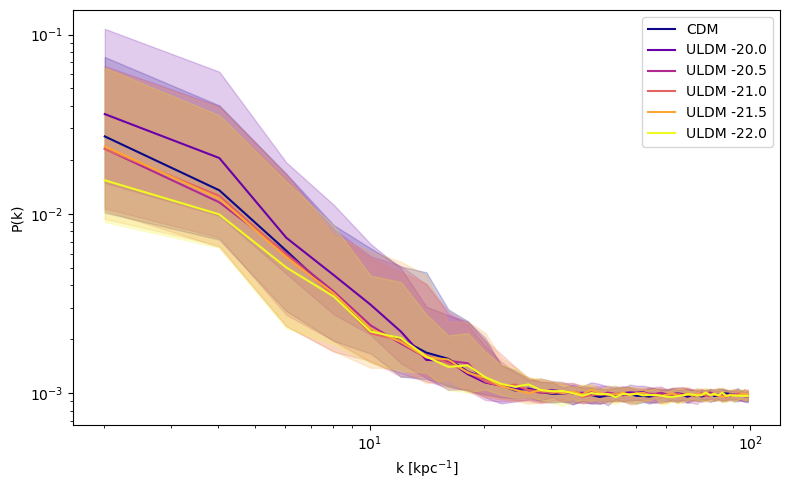

In [38]:
mpl.rcdefaults()

labels = ['CDM']

for mass in uldm_masses:
    
    labels.append(f'ULDM {mass}')
    
n_colors = len(all_subs_residuals)

viridis = cm.get_cmap('plasma', n_colors)
colors = [viridis(i) for i in range(n_colors)]
    
plt.figure(figsize=(8, 5))

for i in range(len(all_subs_residuals)):
               
    all_residuals = all_subs_residuals[i]

    K, ps, ind_curves = compute_ps(all_residuals, substructure_model, lens_cosmo)

    arr = np.array(ind_curves)
    lower  = np.percentile(arr, 16, axis=0)
    median = np.percentile(arr, 50, axis=0)
    upper  = np.percentile(arr, 84, axis=0)

    plt.loglog(K, median, color=colors[i], label=labels[i])
    plt.fill_between(K, lower, upper, color=colors[i], alpha=0.2)

plt.xlabel("k [kpc$^{-1}$]")
plt.ylabel("P(k)")
plt.legend()
plt.tight_layout()
plt.show()